# Students
- **Omid Nejati**, 0001154905, omid.nejati@studio.unibo.it
- **Alireza Shahidiani**, 0001154402, alireza.shahidiani@studio.unib.it


# **Product Recognition of Books**

## Image Processing and Computer Vision - Assignment Module \#1

Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

Computer vision-based object detection techniques can be applied in library or bookstore settings to build a system that identifies books on shelves.

Such a system could assist in:
* Helping visually impaired users locate books by title/author;
* Automating inventory management (e.g., detecting misplaced or out-of-stock books);
* Enabling faster book retrieval by recognizing spine text or cover designs.

## Task
Develop a computer vision system that, given a reference image for each book, is able to identify such book from one picture of a shelf.

<figure>
<a href="https://ibb.co/pvLVjbM5"><img src="https://i.ibb.co/svVx9bNz/example.png" alt="example" border="0"></a>
</figure>

For each type of product displayed on the shelf, the system should compute a bounding box aligned with the book spine or cover and report:
1. Number of instances;
1. Dimension of each instance (area in pixel of the bounding box that encloses each one of them);
1. Position in the image reference system of each instance (four corners of the bounding box that enclose them);
1. Overlay of the bounding boxes on the scene images.

<font color="red"><b>Each step of this assignment must be solved using traditional computer vision techniques.</b></font>

#### Example of expected output
```
Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (100,200), top_right: (110, 220), bottom_left: (10, 202), bottom_right: (10, 208), area: 230px}
  Instance 2 {top_left: (90,310), top_right: (95, 340), bottom_left: (24, 205), bottom_right: (23, 234), area: 205px}
Book 1 – 1 instance(s) found:
.
.
.
```

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify;
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

# """
# # images should be in the folder AssignmentsIPCV/dataset_one.zip otherwise
# # change the path below
# """

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
   creating: dataset/scenes/
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: dataset/scenes/scene_9.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_9.jpg  
  inflating: dataset/scenes/scene_8.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_8.jpg  
  inflating: dataset/scenes/scene_20.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_20.jpg  
  inflating: dataset/scenes/scene_21.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_21.jpg  
  inflating: dataset/scenes/scene_23.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_23.jpg  
  inflating: dataset/scenes/scene_22.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_22.jpg  
  inflating: dataset/scenes/scene_26.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_26.jpg  
  inflating: dataset/scenes/scene_27.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_27.jpg  
  inflating: datas

## Evaluation criteria
1. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

2. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed and justified approach that solves more or all instances.

# Solution


## 0. Libraries

In [2]:
import cv2, re, os, glob
import numpy as np
import matplotlib.pyplot as plt

## 1. Load and Sort Dataset Images  
This step arranges all image files in natural numerical order and loads them into memory, ensuring they are properly organized and ready for the following processing steps.


In [3]:
def natural_key(path):
  # Generate a sorting key by splitting filenames into numeric and text parts
    fname = os.path.basename(path)
    return [int(t) if t.isdigit() else t.lower() for t in re.split(r'(\d+)', fname)]

# Get and sort scene and model file paths using natural order
scene_files = sorted(glob.glob('dataset/scenes/*.jpg'), key=natural_key)
model_files = sorted(glob.glob('dataset/models/*.png'), key=natural_key)


# Load all sorted scene and model images
scenes = [cv2.imread(p) for p in scene_files]
models = [cv2.imread(p) for p in model_files]


## 2. Convert Images to Grayscale  
Transforms all loaded images into grayscale to prepare them for detection, as most detection algorithms work more effectively on single-channel images.


In [4]:
# Convert all loaded images to grayscale for detection
scenes_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in scenes if img is not None]
models_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in models if img is not None]

print("Scenes loaded:", len(scenes_gray))
print("Models loaded:", len(models_gray))

Scenes loaded: 29
Models loaded: 22


## 3. Keypoints Detection  
Detects distinctive and repeatable keypoints in all model and scene images using **SIFT**, which is robust to changes in scale and rotation.


In [5]:
# Detect keypoints in all model and scene images using SIFT

def sift_detect_all(models_gray, scenes_gray):
    sift = cv2.SIFT_create()
    kp_models = [sift.detect(m) for m in models_gray]
    kp_scenes = [sift.detect(s) for s in scenes_gray]
    return sift, kp_models, kp_scenes

# Run detection
sift, kp_models, kp_scenes = sift_detect_all(models_gray, scenes_gray)


## 4. Keypoint Description  
Generates feature descriptors for all detected keypoints using **SIFT**, capturing unique patterns around each point. These descriptors allow reliable matching between models and scenes, even under scale, rotation, or lighting changes.


In [6]:
# Compute descriptors for all detected keypoints in models and scenes

def compute_sift_descriptors(models_gray, scenes_gray, kp_models, kp_scenes, sift):
    desc_models = []
    desc_scenes = []

    for m, kp_m in zip(models_gray, kp_models):
        kp, des = sift.compute(m, kp_m)
        desc_models.append((kp, des))

    for s, kp_s in zip(scenes_gray, kp_scenes):
        kp, des = sift.compute(s, kp_s)
        desc_scenes.append((kp, des))

    return desc_models, desc_scenes

# Run descriptor computation
desc_models, desc_scenes = compute_sift_descriptors(models_gray, scenes_gray, kp_models, kp_scenes, sift)


## 5. Feature Matching  
Uses **FLANN** to efficiently match descriptors between model and scene images. FLANN accelerates nearest-neighbor searches, making it suitable for high-dimensional descriptors like those from SIFT, and is ideal for handling multiple model-scene comparisons.


In [7]:
# Match descriptors between each model and scene using FLANN

def flann_match_all(desc_models, desc_scenes, k=2):
    index_params = dict(algorithm=1, trees=5)  # KD-tree for SIFT descriptors
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    all_matches = []
    for kp_m, des_m in desc_models:
        scene_matches = []
        for kp_s, des_s in desc_scenes:
            matches = flann.knnMatch(des_m, des_s, k)
            scene_matches.append(matches)
        all_matches.append(scene_matches)

    return all_matches

# Run matching
all_matches = flann_match_all(desc_models, desc_scenes)


## 6. Filtering False Matches  
Applies **Lowe's ratio test** to discard ambiguous matches. A match is kept only if its closest match is significantly better than the second-closest, reducing false positives and improving reliability.


In [8]:
# Apply Lowe's ratio test to remove unreliable matches

def filter_matches(all_matches, ratio=0.7):
    filtered = []
    for scene_group in all_matches:
        scene_filtered = []
        for match_list in scene_group:
            good = [m for m, n in match_list if m.distance < ratio * n.distance]
            scene_filtered.append(good)
        filtered.append(scene_filtered)
    return filtered

# Run filtering
filtered_matches = filter_matches(all_matches)


## 7. Position Estimation  
Uses **RANSAC** to estimate a homography between matched keypoints of the model and scene. This step verifies inliers and geometric constraints to accurately locate the object while discarding outliers.


In [9]:
# Estimate object location in the scene using homography with RANSAC

def compute_homography(kp_model, kp_scene, matches, min_matches, model_shape, scene_shape):
    if len(matches) < min_matches:
        return None

    src_points = np.float32([kp_model[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_points = np.float32([kp_scene[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_points, dst_points, cv2.RANSAC, 5.0)
    if H is None or mask is None:
        return None

    inlier_count = np.sum(mask)
    if inlier_count < min_matches:
        return None

    h, w = model_shape
    corners = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
    projected_corners = cv2.perspectiveTransform(corners, H)

    if (np.any(projected_corners < 0) or
        np.any(projected_corners[:, 0, 0] > scene_shape[1]) or
        np.any(projected_corners[:, 0, 1] > scene_shape[0]) or
        cv2.contourArea(np.int32(projected_corners)) < 100):
        return None

    return H, mask.ravel(), projected_corners


## 8. Filtering Used Keypoints  
After each homography detection, previously matched keypoints are removed from the scene. This allows re-running the process to detect multiple instances of the same object without overlap from earlier matches.


In [10]:
## 8. Filtering Used Keypoints
# Remove scene keypoints that were already matched in previous detections

def remove_used_keypoints(kp_scene, des_scene, used_indices):
    new_kp = []
    new_des = []
    index_map = {}

    for i, (kp, des) in enumerate(zip(kp_scene, des_scene)):
        if i not in used_indices:
            index_map[len(new_kp)] = i
            new_kp.append(kp)
            new_des.append(des)

    return new_kp, np.array(new_des, dtype=np.float32), index_map


## 9. Non-Maximum Suppression (NMS)  
Reduces duplicate detections by removing overlapping bounding boxes.  
The strongest detection is kept, while overlapping ones exceeding a set threshold are discarded, ensuring only distinct and reliable object detections remain.


In [11]:
# Remove overlapping detections to keep only the strongest ones

def contour_to_bbox(contour):
    """
    Converts an object contour into an axis-aligned bounding box
    using its top-left (x1, y1) and bottom-right (x2, y2) corners.
    """
    x_coords = contour[:, 0, 0]
    y_coords = contour[:, 0, 1]
    x1, y1 = np.min(x_coords), np.min(y_coords)
    x2, y2 = np.max(x_coords), np.max(y_coords)
    return [x1, y1, x2, y2]

def apply_nms(detections, overlap_threshold=0.3):
    if len(detections) == 0:
        return []

    rects = np.array([contour_to_bbox(c) for c, _ in detections])
    selected = []

    x1, y1, x2, y2 = rects[:, 0], rects[:, 1], rects[:, 2], rects[:, 3]
    areas = (x2 - x1) * (y2 - y1)
    idxs = np.argsort(y2)

    while len(idxs) > 0:
        last = idxs[-1]
        selected.append(last)

        xx1 = np.maximum(x1[last], x1[idxs[:-1]])
        yy1 = np.maximum(y1[last], y1[idxs[:-1]])
        xx2 = np.minimum(x2[last], x2[idxs[:-1]])
        yy2 = np.minimum(y2[last], y2[idxs[:-1]])

        w = np.maximum(0, xx2 - xx1)
        h = np.maximum(0, yy2 - yy1)
        overlap = (w * h) / areas[idxs[:-1]]

        idxs = np.delete(idxs, np.concatenate(([len(idxs) - 1], np.where(overlap > overlap_threshold)[0])))

    return [detections[i] for i in selected]


## 10. Multiple Instance Detection Algorithm  
This function integrates all steps from keypoint detection to homography estimation into a complete pipeline for detecting multiple instances of a model within a scene.  

1. **Keypoint Detection & Description:** SIFT is used to detect and describe keypoints for both the model and scene.  
2. **Descriptor Matching:** FLANN efficiently matches descriptors between model and scene.  
3. **Filtering Matches:** Lowe’s ratio test is applied to remove ambiguous matches.  
4. **Homography Estimation:** RANSAC computes a valid transformation while discarding outliers.  
5. **Keypoint Filtering:** Previously matched keypoints are removed to detect additional instances.  
6. **Non-Max Suppression:** Overlapping detections are filtered, keeping only the strongest results.  

By tuning `min_match_count` and `max_instances`, the sensitivity and number of detections can be controlled.


In [12]:
# Combines all previous steps (2 to 8) into a complete pipeline for detecting multiple instances.

def multiple_instances_detection(img_model, img_scene, min_match_count=10, max_instances=50):
    # Detect keypoints and compute descriptors
    sift, kp_models, kp_scenes = sift_detect_all([img_model], [img_scene])
    desc_models, desc_scenes = compute_sift_descriptors([img_model], [img_scene], kp_models, kp_scenes, sift)

    kp_model, des_model = desc_models[0]
    kp_scene, des_scene = desc_scenes[0]

    if des_model is None or des_scene is None:
        return []

    des_scene = np.asarray(des_scene, dtype=np.float32)
    detected_boxes = []
    matched_scene_indices = set()

    for _ in range(max_instances):
        # Filter out used scene keypoints
        kp_scene_filt, des_scene_filt, scene_idx_map = remove_used_keypoints(kp_scene, des_scene, matched_scene_indices)
        if len(kp_scene_filt) < min_match_count:
            break

        # Match descriptors using FLANN
        matches = flann_match_all([(kp_model, des_model)], [(kp_scene_filt, des_scene_filt)])[0][0]

        # Filter matches using Lowe's ratio test
        good_matches = filter_matches([[matches]])[0][0]

        # Estimate homography with RANSAC
        result = compute_homography(kp_model, kp_scene_filt, good_matches, min_match_count, img_model.shape, img_scene.shape)
        if result is None:
            break

        H, mask, projected = result
        detected_boxes.append((projected, cv2.contourArea(np.int32(projected))))

        # Track matched keypoints for subsequent iterations
        for i, m in enumerate(good_matches):
            if mask[i]:
                real_idx = scene_idx_map[m.trainIdx]
                matched_scene_indices.add(real_idx)

    # Apply Non-Maximum Suppression to remove overlapping detections
    return apply_nms(detected_boxes)


## 11. Output Formatting  
This function displays the detection results and logs detailed information:  
- Draws colored bounding boxes for each detected instance on the scene image.  
- Shows the model and annotated scene images side by side.  
- Prints the coordinates of each corner and the area of the detected region.  

A separate bright color is used for each instance to clearly distinguish multiple detections.


In [13]:
def print_output(scene_idx, model_idx, img_scene, img_model, boxes, scene_name, model_name):
    colors = [
    (255, 0, 0),     # Red
    (0, 255, 0),     # Green
    (0, 0, 255),     # Blue
    (255, 255, 0),   # Yellow
    (255, 0, 255),   # Magenta
    (0, 255, 255),   # Cyan
    (255, 128, 0),   # Orange
    (128, 0, 255),   # Purple
    (0, 128, 255),   # Sky Blue
    (128, 255, 0),   # Lime
    (255, 0, 128),   # Pink
    (0, 255, 128)    # Aquamarine
]

    scene_copy = img_scene.copy()
    details = f"\n{model_name} - {len(boxes)} instance(s) detected:"

    for i, (box, area) in enumerate(boxes):
        color = colors[i % len(colors)]
        cv2.polylines(scene_copy, [np.int32(box)], True, color, 3)

        details += (
            f"\n  Instance {i+1} {{"
            f"top_left: ({box[1][0][0]:.2f}, {box[1][0][1]:.2f}), "
            f"top_right: ({box[2][0][0]:.2f}, {box[2][0][1]:.2f}), "
            f"bottom_left: ({box[0][0][0]:.2f}, {box[0][0][1]:.2f}), "
            f"bottom_right: ({box[3][0][0]:.2f}, {box[3][0][1]:.2f}), "
            f"area: {area:.2f}px }}"
        )

    plt.figure(figsize=(10, 5), dpi=70)
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_model, cv2.COLOR_BGR2RGB))
    plt.title(model_name)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(scene_copy, cv2.COLOR_BGR2RGB))
    plt.title(scene_name)
    plt.axis("off")

    plt.show()
    print(f"{scene_name}:" + details + "\n")


## Example: Single Model Detection  
Runs the detection pipeline for one selected model and scene, then displays the annotated result with instance details.


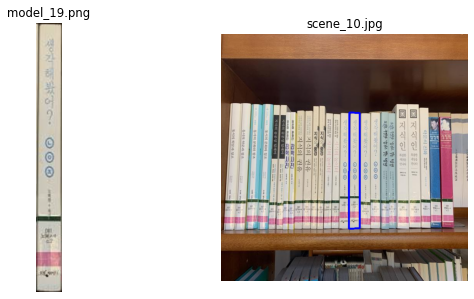

scene_10.jpg:
model_19.png - 1 instance(s) detected:
  Instance 1 {top_left: (331.98, 504.32), top_right: (359.59, 503.79), bottom_left: (332.17, 203.52), bottom_right: (359.64, 204.45), area: 8250.00px }



In [14]:
## Example: Detecting a Model in a Single Scene

# Select a model and scene by index
model_idx = 19
scene_idx = 10

img_model = models_gray[model_idx]
img_scene = scenes_gray[scene_idx]

# Run the detection pipeline
boxes = multiple_instances_detection(img_model, img_scene)

# Pass real filenames to the output function
scene_name = os.path.basename(scene_files[scene_idx])
model_name = os.path.basename(model_files[model_idx])

# Visualize and print results
print_output(scene_idx, model_idx, scenes[scene_idx], models[model_idx], boxes, scene_name, model_name)


## 12. Full Dataset Detection  
This function runs the complete detection pipeline across all models and scenes:
- Iterates through every model-scene pair.
- Runs multi-instance detection for each combination.
- Displays annotated detections with real file names.
- Prints the total count of all detected instances.


In [15]:
# Runs the detection pipeline over all models and scenes in the dataset.

def run_detection_pipeline(gray_models, gray_scenes, orig_models, orig_scenes, model_files, scene_files):
    total_instances = 0

    for scene_idx, scene_img in enumerate(gray_scenes):
        for model_idx, model_img in enumerate(gray_models):

            # Run detection
            boxes = multiple_instances_detection(model_img, scene_img, min_match_count=10, max_instances=5)

            # If instances detected, display output
            if len(boxes) > 0:
                total_instances += len(boxes)

                scene_name = os.path.basename(scene_files[scene_idx])
                model_name = os.path.basename(model_files[model_idx])

                print_output(
                    scene_idx,
                    model_idx,
                    orig_scenes[scene_idx],
                    orig_models[model_idx],
                    boxes,
                    scene_name,
                    model_name
                )
    print(f"\nTotal book instances found: {total_instances}")


## Example: Full Dataset Detection  
Runs the detection pipeline across all model-scene pairs in the dataset and displays annotated results with real file names.


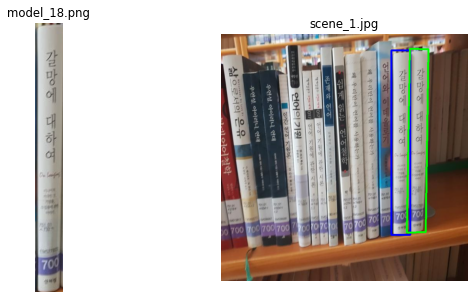

scene_1.jpg:
model_18.png - 2 instance(s) detected:
  Instance 1 {top_left: (441.64, 520.50), top_right: (490.38, 520.50), bottom_left: (441.65, 42.41), bottom_right: (490.40, 42.42), area: 23422.00px }
  Instance 2 {top_left: (481.62, 514.91), top_right: (530.15, 513.29), bottom_left: (489.22, 38.91), bottom_right: (537.39, 39.96), area: 23037.50px }



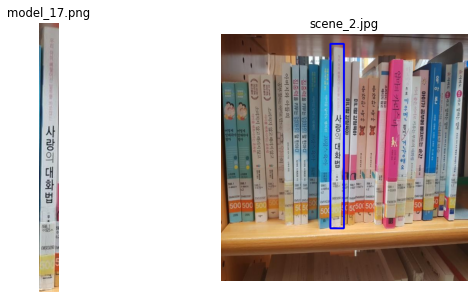

scene_2.jpg:
model_17.png - 1 instance(s) detected:
  Instance 1 {top_left: (283.77, 503.46), top_right: (318.02, 503.36), bottom_left: (283.90, 25.26), bottom_right: (318.12, 25.81), area: 16730.00px }



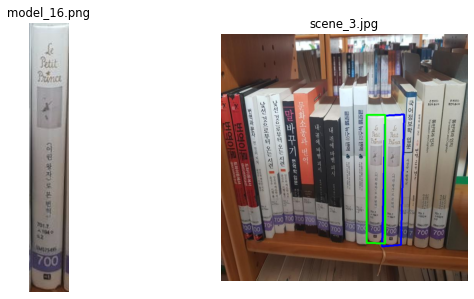

scene_3.jpg:
model_16.png - 2 instance(s) detected:
  Instance 1 {top_left: (417.29, 550.53), top_right: (466.59, 546.70), bottom_left: (425.31, 211.33), bottom_right: (474.76, 208.42), area: 16558.50px }
  Instance 2 {top_left: (377.00, 541.96), top_right: (425.72, 542.39), bottom_left: (377.02, 209.57), bottom_right: (425.76, 209.59), area: 15960.00px }



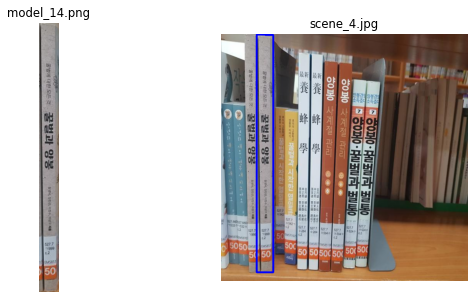

scene_4.jpg:
model_14.png - 1 instance(s) detected:
  Instance 1 {top_left: (92.16, 617.01), top_right: (135.43, 617.12), bottom_left: (92.18, 1.86), bottom_right: (135.45, 2.01), area: 26466.50px }



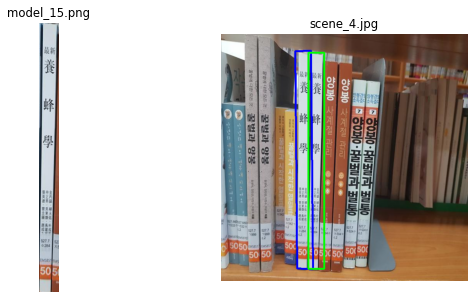

scene_4.jpg:
model_15.png - 2 instance(s) detected:
  Instance 1 {top_left: (197.38, 607.81), top_right: (238.63, 609.20), bottom_left: (192.04, 44.23), bottom_right: (233.72, 43.96), area: 23142.00px }
  Instance 2 {top_left: (226.74, 608.80), top_right: (267.68, 608.74), bottom_left: (226.81, 48.74), bottom_right: (267.73, 48.70), area: 22960.00px }



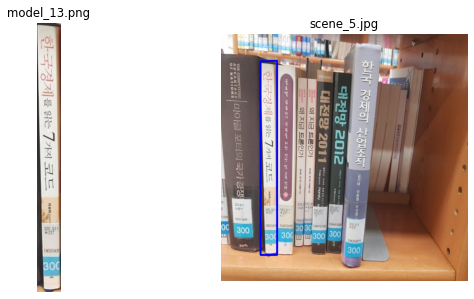

scene_5.jpg:
model_13.png - 1 instance(s) detected:
  Instance 1 {top_left: (102.63, 572.85), top_right: (145.73, 572.95), bottom_left: (102.70, 70.13), bottom_right: (145.80, 69.75), area: 21607.50px }



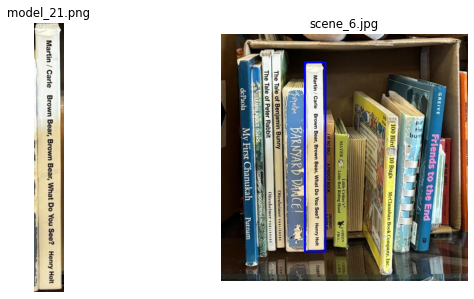

scene_6.jpg:
model_21.png - 1 instance(s) detected:
  Instance 1 {top_left: (217.35, 563.55), top_right: (270.82, 563.58), bottom_left: (217.36, 73.71), bottom_right: (270.84, 73.47), area: 25970.00px }



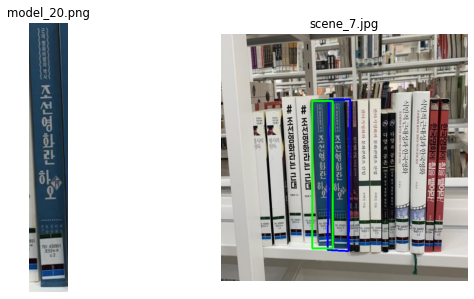

scene_7.jpg:
model_20.png - 2 instance(s) detected:
  Instance 1 {top_left: (276.90, 559.07), top_right: (330.86, 562.85), bottom_left: (279.50, 171.20), bottom_right: (334.34, 169.42), area: 21284.00px }
  Instance 2 {top_left: (236.04, 555.20), top_right: (289.54, 555.29), bottom_left: (236.07, 173.31), bottom_right: (289.58, 173.17), area: 20246.00px }



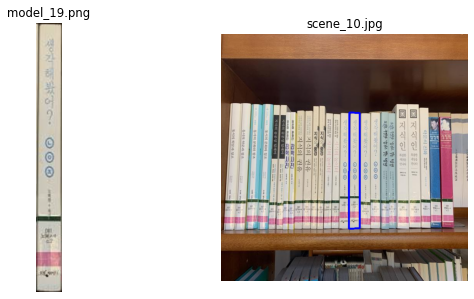

scene_10.jpg:
model_19.png - 1 instance(s) detected:
  Instance 1 {top_left: (331.98, 504.32), top_right: (359.59, 503.79), bottom_left: (332.17, 203.52), bottom_right: (359.64, 204.45), area: 8250.00px }



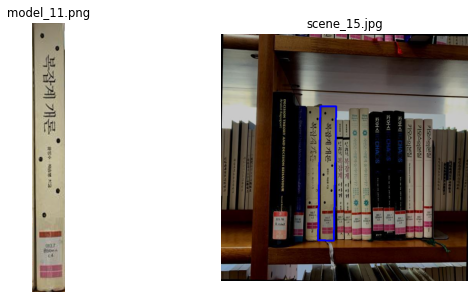

scene_15.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (251.64, 534.47), top_right: (292.53, 535.79), bottom_left: (257.55, 187.41), bottom_right: (298.55, 187.05), area: 14250.50px }



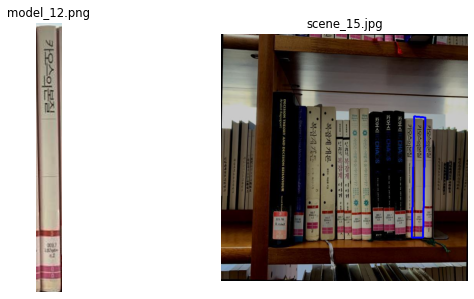

scene_15.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.54, 527.49), top_right: (523.54, 527.66), bottom_left: (500.26, 213.97), bottom_right: (529.14, 216.25), area: 9071.50px }



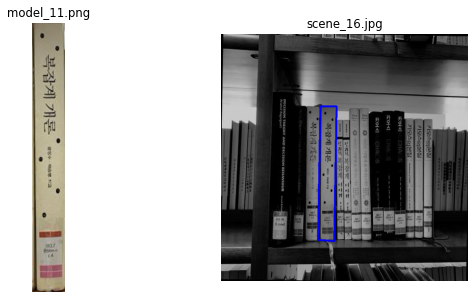

scene_16.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (251.22, 533.79), top_right: (293.03, 536.60), bottom_left: (257.21, 187.48), bottom_right: (299.14, 187.20), area: 14604.00px }



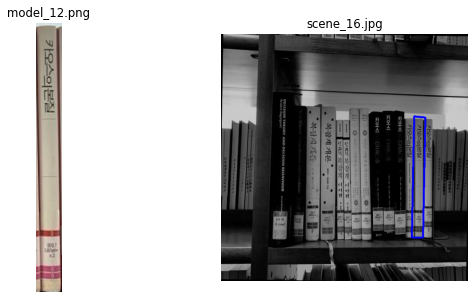

scene_16.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.48, 527.35), top_right: (523.82, 527.49), bottom_left: (500.20, 213.95), bottom_right: (529.44, 216.27), area: 9071.50px }



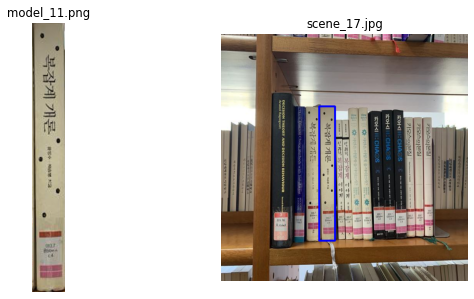

scene_17.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (254.67, 535.39), top_right: (295.72, 535.71), bottom_left: (254.78, 187.83), bottom_right: (295.80, 187.68), area: 14268.00px }



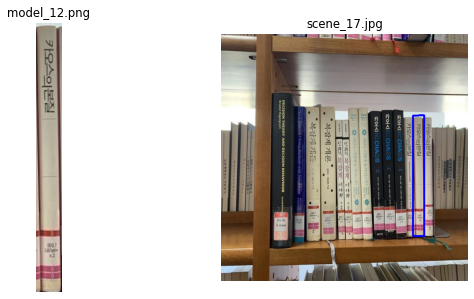

scene_17.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (497.58, 523.54), top_right: (526.88, 523.79), bottom_left: (497.63, 211.63), bottom_right: (526.88, 210.99), area: 9062.50px }



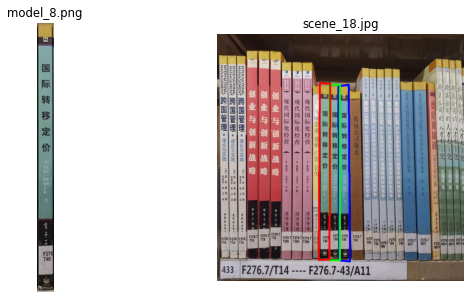

scene_18.jpg:
model_8.png - 3 instance(s) detected:
  Instance 1 {top_left: (316.94, 586.59), top_right: (344.58, 589.05), bottom_left: (314.20, 135.52), bottom_right: (341.75, 131.01), area: 12500.00px }
  Instance 2 {top_left: (291.07, 586.91), top_right: (318.05, 586.98), bottom_left: (291.08, 131.06), bottom_right: (318.06, 131.35), area: 12285.00px }
  Instance 3 {top_left: (263.92, 585.71), top_right: (291.26, 584.79), bottom_left: (266.19, 127.62), bottom_right: (293.56, 128.85), area: 12567.50px }



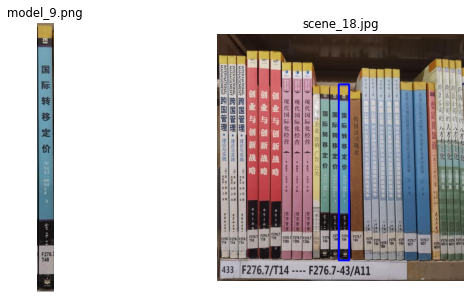

scene_18.jpg:
model_9.png - 1 instance(s) detected:
  Instance 1 {top_left: (315.36, 586.62), top_right: (342.53, 586.31), bottom_left: (315.39, 130.90), bottom_right: (342.54, 130.54), area: 12312.00px }



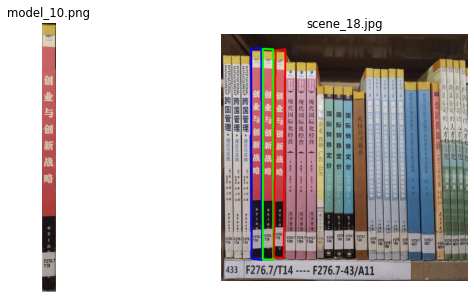

scene_18.jpg:
model_10.png - 3 instance(s) detected:
  Instance 1 {top_left: (79.42, 582.09), top_right: (106.21, 585.46), bottom_left: (78.04, 37.60), bottom_right: (104.71, 36.24), area: 14494.00px }
  Instance 2 {top_left: (108.89, 584.99), top_right: (135.90, 584.89), bottom_left: (108.86, 38.74), bottom_right: (135.85, 39.09), area: 14728.50px }
  Instance 3 {top_left: (137.94, 578.83), top_right: (162.91, 580.09), bottom_left: (141.06, 42.25), bottom_right: (166.76, 39.89), area: 13460.50px }



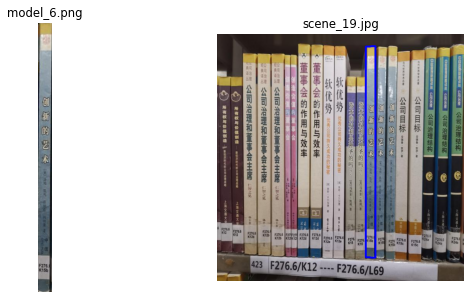

scene_19.jpg:
model_6.png - 1 instance(s) detected:
  Instance 1 {top_left: (385.16, 578.90), top_right: (410.91, 579.31), bottom_left: (385.11, 32.02), bottom_right: (410.86, 31.99), area: 13675.00px }



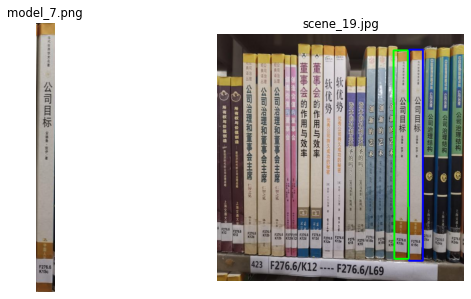

scene_19.jpg:
model_7.png - 2 instance(s) detected:
  Instance 1 {top_left: (497.14, 587.44), top_right: (533.45, 587.44), bottom_left: (497.11, 40.23), bottom_right: (533.44, 40.37), area: 19692.00px }
  Instance 2 {top_left: (459.34, 582.55), top_right: (496.14, 582.94), bottom_left: (457.57, 42.69), bottom_right: (494.62, 42.81), area: 19980.00px }



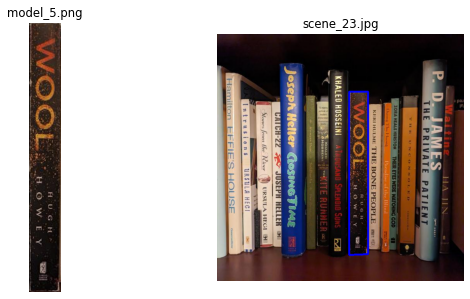

scene_23.jpg:
model_5.png - 1 instance(s) detected:
  Instance 1 {top_left: (342.50, 572.02), top_right: (391.25, 570.91), bottom_left: (342.37, 149.01), bottom_right: (391.21, 149.66), area: 20678.00px }



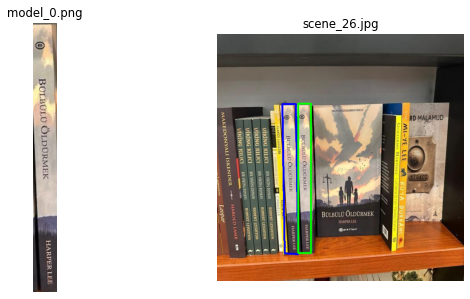

scene_26.jpg:
model_0.png - 2 instance(s) detected:
  Instance 1 {top_left: (175.56, 568.22), top_right: (210.20, 571.00), bottom_left: (169.63, 181.88), bottom_right: (204.58, 181.45), area: 13574.00px }
  Instance 2 {top_left: (210.23, 567.61), top_right: (243.73, 567.88), bottom_left: (210.27, 180.43), bottom_right: (243.76, 180.54), area: 12771.00px }



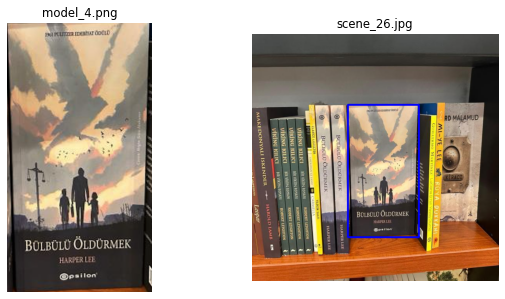

scene_26.jpg:
model_4.png - 1 instance(s) detected:
  Instance 1 {top_left: (248.59, 526.23), top_right: (432.26, 526.19), bottom_left: (248.53, 183.13), bottom_right: (432.22, 183.07), area: 63112.00px }



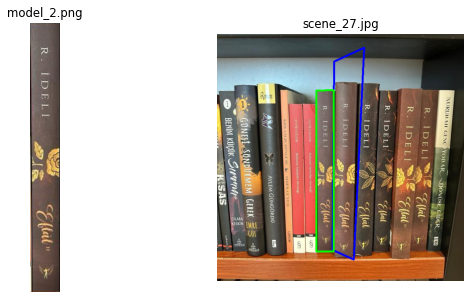

scene_27.jpg:
model_2.png - 2 instance(s) detected:
  Instance 1 {top_left: (299.67, 559.17), top_right: (354.97, 584.90), bottom_left: (303.85, 71.50), bottom_right: (381.53, 35.02), area: 34395.00px }
  Instance 2 {top_left: (257.90, 563.14), top_right: (302.54, 563.85), bottom_left: (257.87, 146.79), bottom_right: (302.51, 145.93), area: 18787.50px }



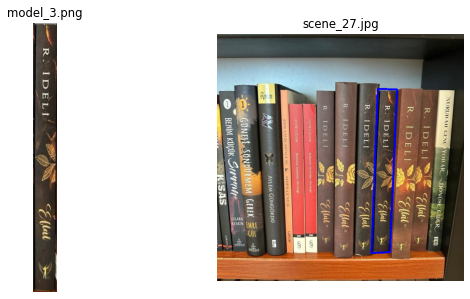

scene_27.jpg:
model_3.png - 1 instance(s) detected:
  Instance 1 {top_left: (400.25, 567.13), top_right: (448.82, 565.84), bottom_left: (416.03, 142.11), bottom_right: (466.22, 143.25), area: 20743.00px }



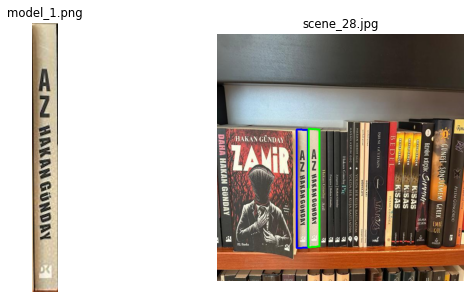

scene_28.jpg:
model_1.png - 2 instance(s) detected:
  Instance 1 {top_left: (206.89, 554.79), top_right: (235.62, 553.86), bottom_left: (206.83, 247.60), bottom_right: (235.53, 248.56), area: 8874.00px }
  Instance 2 {top_left: (236.21, 552.20), top_right: (265.05, 550.80), bottom_left: (237.42, 245.21), bottom_right: (265.89, 247.02), area: 8692.50px }


Total book instances found: 38


In [16]:
# Example usage: Run detection across the full dataset
run_detection_pipeline(
    models_gray,
    scenes_gray,
    models,
    scenes,
    model_files,  # Pass file paths for proper naming
    scene_files
)


## 12. Image Processing  
To improve object detection performance, we apply filters and transformations to preprocess the input images. This step is crucial for reducing noise and enhancing relevant image features.

### Filter Choice  
Before selecting a filter, it is important to analyze whether the dataset images contain noise and identify its type.  

To determine if our filtering process effectively reduces noise, we analyze the **variance of the Laplacian**. This approach relies on the fact that noisy images typically contain rapid intensity changes, which increase the Laplacian response.  
- A **larger variance** suggests more abrupt pixel changes, often caused by noise.  
- A **smaller variance** indicates a smoother image, showing that unwanted variations have been reduced.  
This makes it a simple yet practical way to evaluate how well our filter performs.  
  





## 13. Laplacian Variance Calculation  
Defines a function to compute the **Laplacian variance** of a set of images:  
- Calculates the Laplacian operator for each image.  
- Computes its variance to quantify sharpness or noise.  
- Returns normalized Laplacian images for visualization and the variance values for analysis.


In [17]:
# Computes Laplacian variance to evaluate image sharpness or noise level.

def laplacian_variance(images):
    # Compute Laplacian for each image
    laplacian_images = [cv2.Laplacian(img, cv2.CV_64F) for img in images]

    # Calculate variance of Laplacian (sharpness/noise metric)
    laplacian_vars = [lap_img.var() for lap_img in laplacian_images]

    # Normalize Laplacian images for visualization
    normalized_laplacian = [
        cv2.normalize(lap_img, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
        for lap_img in laplacian_images
    ]

    return normalized_laplacian, laplacian_vars


## 14. Plot Laplacian Variance  
This function visualizes the **Laplacian variance** values to help assess the noise or sharpness level of images.  

- It plots the variance for each image and overlays a threshold line for reference.  
- If no threshold is specified, it is automatically computed based on the data distribution:  
  - **Default:** Mean + half the standard deviation of all variance values.  
- Variances above the threshold typically indicate noisier or sharper images, while lower values suggest smoother images.  

This visualization is useful for quickly identifying images that may require additional filtering or preprocessing.


In [18]:
def plot_laplacian_variance(laplacian_vars_list, img_type, title, threshold=None, laplacian_labels=None):

    plt.figure(figsize=(10, 5))

    # Automatically compute threshold if none is provided
    if threshold is None:
        flat_vals = [v for sublist in laplacian_vars_list for v in sublist]
        threshold = np.mean(flat_vals) + (np.std(flat_vals) / 2)

    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    markers = ['o', 's', '^', 'D']

    # Plot variance curves
    for i, lap in enumerate(laplacian_vars_list):
        plt.plot(
            lap,
            linestyle='-',
            marker=markers[i % len(markers)],
            color=colors[i % len(colors)],
            linewidth=2,
            markersize=6,
            label=laplacian_labels[i] if laplacian_labels else f'{img_type} Set {i+1}'
        )

    # Draw threshold line
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold: {threshold:.0f}')

    # Plot formatting
    plt.title(title, fontsize=14, weight='bold')
    plt.xlabel(f'{img_type} Index', fontsize=12)
    plt.ylabel('Laplacian Variance', fontsize=12)
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.legend(loc='upper right', frameon=True)
    plt.tight_layout()
    plt.show()


## 15. Laplacian Variance on Original Images  
We compute the Laplacian variance of the original grayscale scene and model images to assess their sharpness and noise levels.

- A fixed threshold of **2000** is used for scene images, as they generally show higher variance.
- A threshold of **500** is used for model images, reflecting their overall lower variance.

The plots help visually identify which images may be too noisy or too smooth, providing a baseline for filter selection and evaluation.


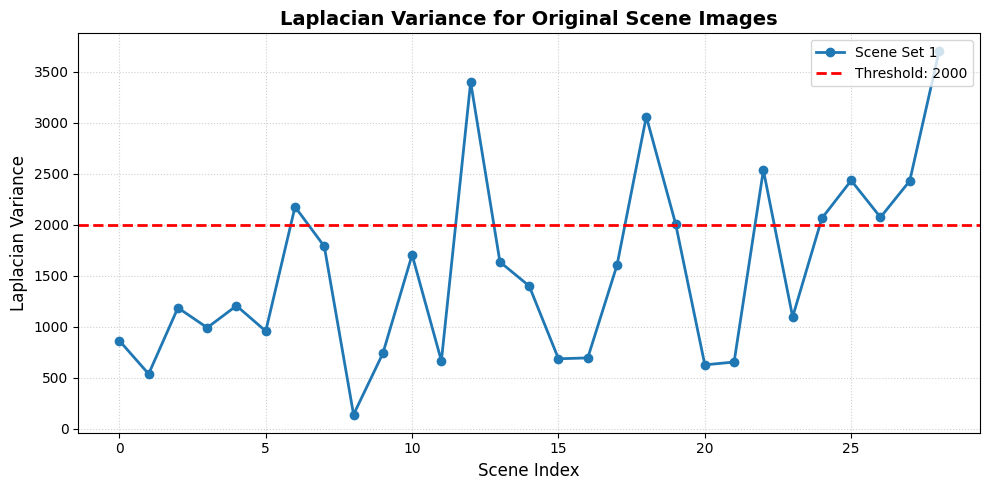

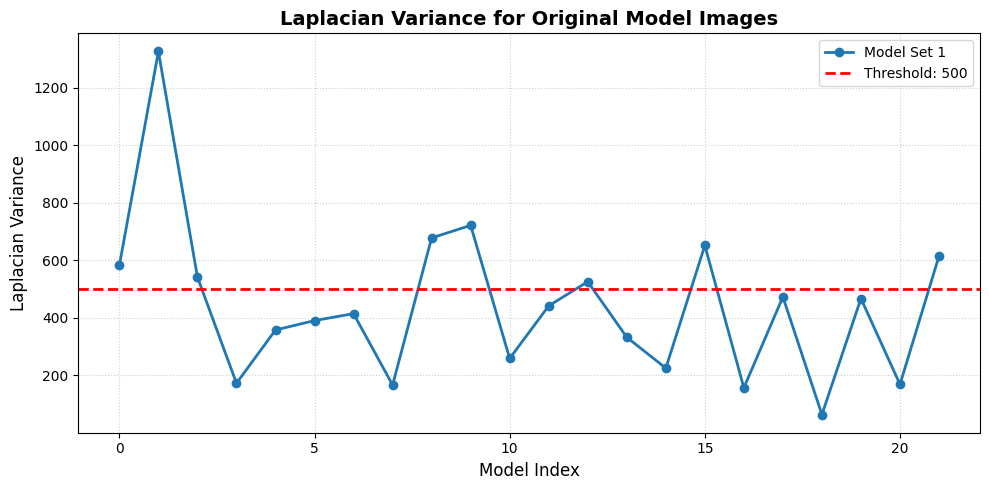

In [19]:
# Compute Laplacian variance for grayscale scenes and models
lap_s_images, lap_s_vars = laplacian_variance(scenes_gray)
lap_m_images, lap_m_vars = laplacian_variance(models_gray)

# Manually defined thresholds for visualization
scene_threshold = 2000
model_threshold = 500

# Plotting Laplacian variance for scenes and models
plot_laplacian_variance([lap_s_vars], "Scene", "Laplacian Variance for Original Scene Images", threshold=scene_threshold)
plot_laplacian_variance([lap_m_vars], "Model", "Laplacian Variance for Original Model Images", threshold=model_threshold)


The Laplacian variance plots indicate that most **scene images** have values well above 2000, while **model images** generally stay around or below 500. These results highlight the presence of noticeable noise in the dataset.  

Based on this analysis, we establish the following thresholds for reference:  
- **2000** for scene images  
- **500** for model images  

These thresholds provide a baseline for assessing noise reduction when applying filters. The next step is to visually inspect a few sample images to confirm the type and intensity of noise before selecting an appropriate denoising method.


## 16. Visual Inspection of Sample Images  
We visually examine a few sample model and scene images to better understand the type and level of noise present.  

From direct observation, there is no clear evidence of **salt-and-pepper noise** in the dataset. This suggests that filters specifically designed for this type of noise, such as the **Median filter**, may not be necessary.  

To confirm this observation, we will still apply a Median filter and analyze its effect on Laplacian variance and detection performance.


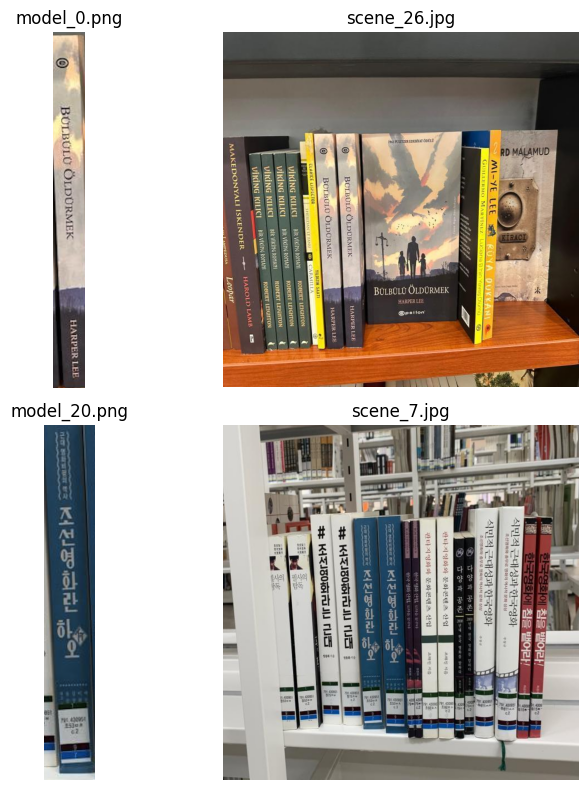

In [20]:
# Choose model and scene indices to display
model_indices = [0, 20]
scene_indices = [26, 7]

plt.figure(figsize=(8, 8))

# Display model samples
plt.subplot(2, 2, 1)
model_idx = model_indices[0]
plt.imshow(cv2.cvtColor(models[model_idx], cv2.COLOR_BGR2RGB))
plt.title(f"{os.path.basename(model_files[model_idx])}")
plt.axis('off')

plt.subplot(2, 2, 3)
model_idx = model_indices[1]
plt.imshow(cv2.cvtColor(models[model_idx], cv2.COLOR_BGR2RGB))
plt.title(f"{os.path.basename(model_files[model_idx])}")
plt.axis('off')

# Display scene samples
plt.subplot(2, 2, 2)
scene_idx = scene_indices[0]
plt.imshow(cv2.cvtColor(scenes[scene_idx], cv2.COLOR_BGR2RGB))
plt.title(f"{os.path.basename(scene_files[scene_idx])}")
plt.axis('off')

plt.subplot(2, 2, 4)
scene_idx = scene_indices[1]
plt.imshow(cv2.cvtColor(scenes[scene_idx], cv2.COLOR_BGR2RGB))
plt.title(f"{os.path.basename(scene_files[scene_idx])}")
plt.axis('off')

plt.tight_layout()
plt.show()


## 17. Applying Median Filter and Evaluating Impact  

To verify if a **Median filter** helps reduce noise, we applied it to all grayscale images. Median filtering is commonly used to remove **salt-and-pepper noise**, but based on our previous inspection, this type of noise is not present.

However, we still tested the filter to evaluate its effect on both **Laplacian variance** and **detection performance**.

- The plots show a visible **reduction in Laplacian variance** for both model and scene images, meaning smoother images.
- While reduced variance may indicate less noise, it can also blur important details and edges.

To confirm this, we re-ran the detection algorithm using the filtered images.  
**Result**: only **28 instances** were detected, compared to **38** with the original images.  

This confirms that, despite reducing noise, the **Median filter is not suitable for this dataset**, as it removes valuable information needed for reliable detection.


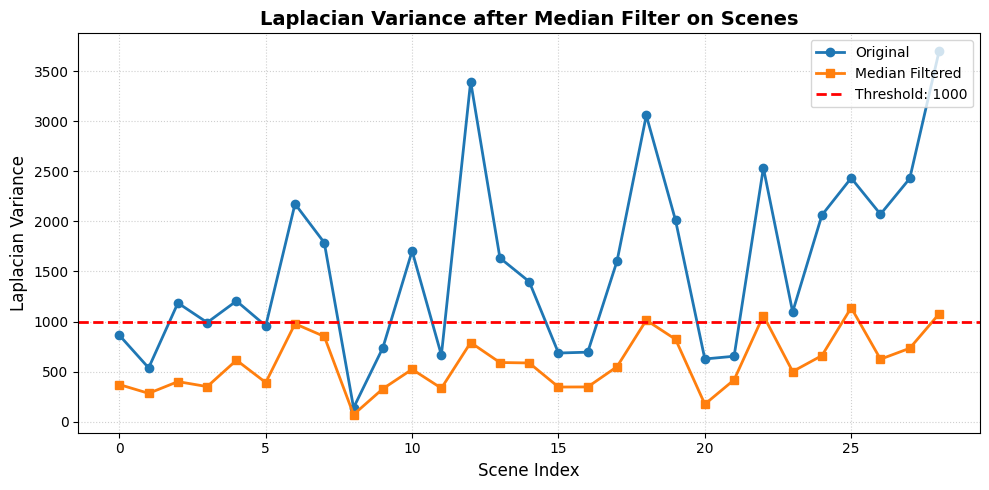

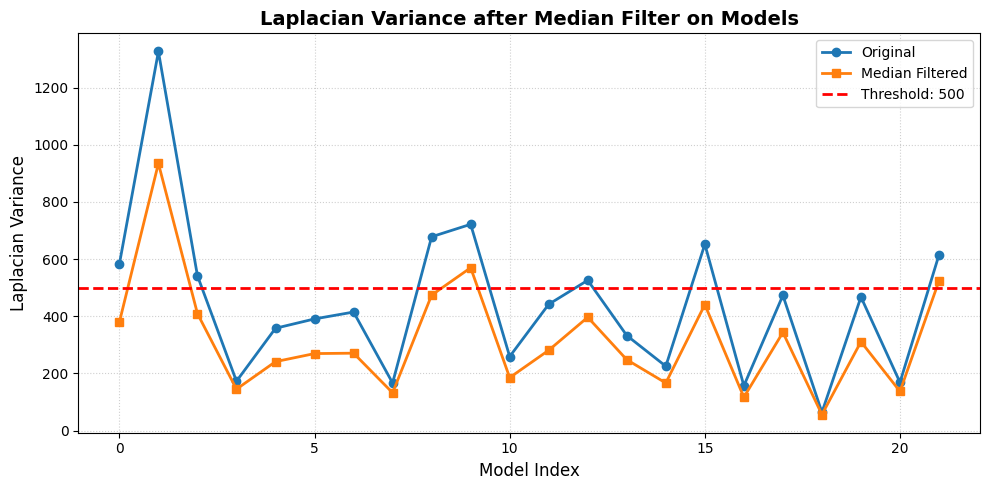

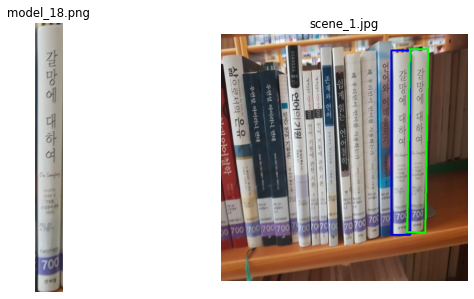

scene_1.jpg:
model_18.png - 2 instance(s) detected:
  Instance 1 {top_left: (441.70, 520.46), top_right: (490.20, 520.61), bottom_left: (441.84, 42.27), bottom_right: (490.35, 42.57), area: 23422.00px }
  Instance 2 {top_left: (482.60, 513.14), top_right: (529.80, 514.25), bottom_left: (489.88, 39.14), bottom_right: (536.85, 39.88), area: 22305.00px }



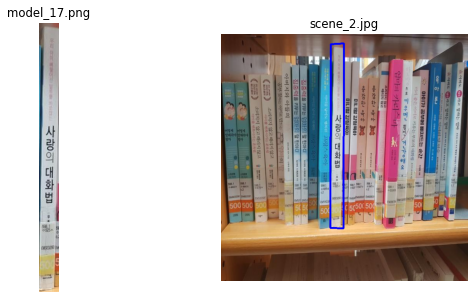

scene_2.jpg:
model_17.png - 1 instance(s) detected:
  Instance 1 {top_left: (283.93, 502.46), top_right: (317.89, 503.61), bottom_left: (284.12, 26.95), bottom_right: (318.11, 24.57), area: 16234.50px }



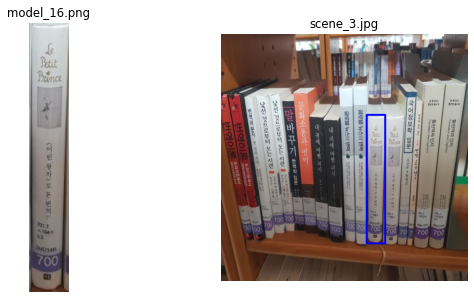

scene_3.jpg:
model_16.png - 1 instance(s) detected:
  Instance 1 {top_left: (377.20, 542.07), top_right: (425.26, 542.48), bottom_left: (377.41, 209.56), bottom_right: (425.48, 209.49), area: 15984.00px }



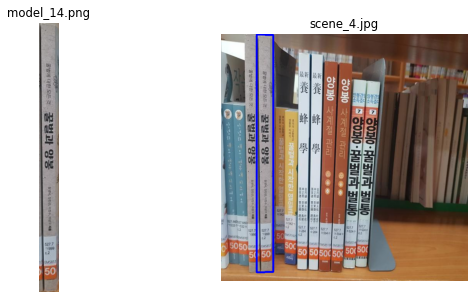

scene_4.jpg:
model_14.png - 1 instance(s) detected:
  Instance 1 {top_left: (92.41, 617.17), top_right: (135.06, 616.74), bottom_left: (92.50, 1.94), bottom_right: (135.14, 2.24), area: 26445.00px }



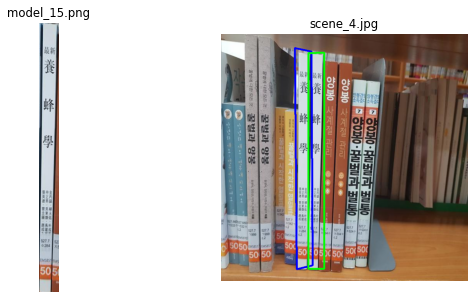

scene_4.jpg:
model_15.png - 2 instance(s) detected:
  Instance 1 {top_left: (196.85, 609.05), top_right: (237.72, 599.55), bottom_left: (191.46, 36.39), bottom_right: (234.03, 45.97), area: 23669.00px }
  Instance 2 {top_left: (226.70, 608.62), top_right: (267.64, 608.80), bottom_left: (226.83, 49.36), bottom_right: (267.77, 48.09), area: 22939.50px }



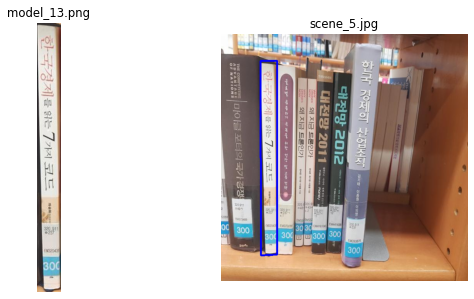

scene_5.jpg:
model_13.png - 1 instance(s) detected:
  Instance 1 {top_left: (103.12, 573.65), top_right: (145.30, 571.79), bottom_left: (102.94, 69.66), bottom_right: (145.17, 69.98), area: 21378.00px }



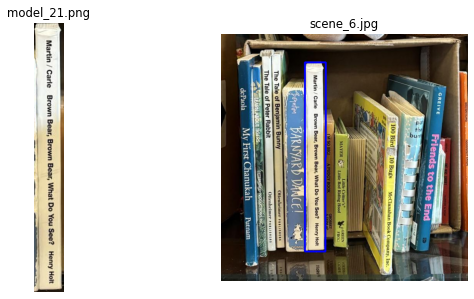

scene_6.jpg:
model_21.png - 1 instance(s) detected:
  Instance 1 {top_left: (217.21, 563.19), top_right: (270.84, 563.46), bottom_left: (217.32, 73.37), bottom_right: (271.08, 73.17), area: 26215.00px }



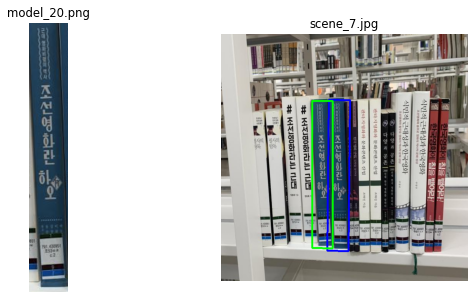

scene_7.jpg:
model_20.png - 2 instance(s) detected:
  Instance 1 {top_left: (275.89, 561.02), top_right: (330.60, 562.89), bottom_left: (279.38, 170.15), bottom_right: (334.61, 171.04), area: 21509.00px }
  Instance 2 {top_left: (236.67, 554.86), top_right: (289.15, 555.40), bottom_left: (236.45, 173.41), bottom_right: (289.00, 173.02), area: 20219.50px }



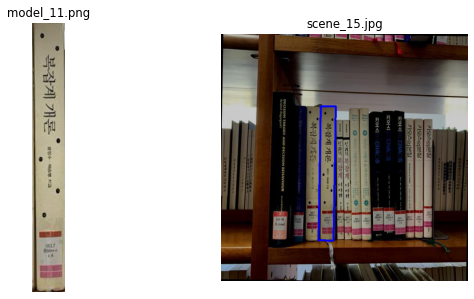

scene_15.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (252.38, 534.91), top_right: (291.68, 535.31), bottom_left: (258.30, 187.54), bottom_right: (297.70, 187.36), area: 13555.50px }



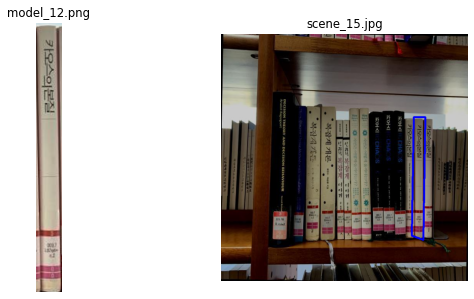

scene_15.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.82, 522.06), top_right: (524.34, 533.94), bottom_left: (499.73, 215.39), bottom_right: (529.27, 215.23), area: 9402.50px }



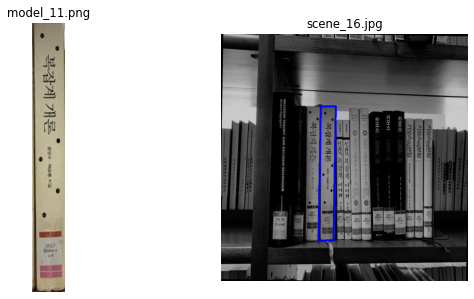

scene_16.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (252.47, 535.33), top_right: (291.72, 534.91), bottom_left: (258.21, 187.45), bottom_right: (297.56, 187.32), area: 13549.50px }



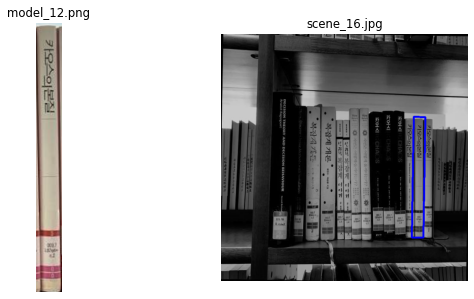

scene_16.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.16, 527.49), top_right: (524.35, 527.97), bottom_left: (499.17, 214.20), bottom_right: (529.29, 215.37), area: 9377.50px }



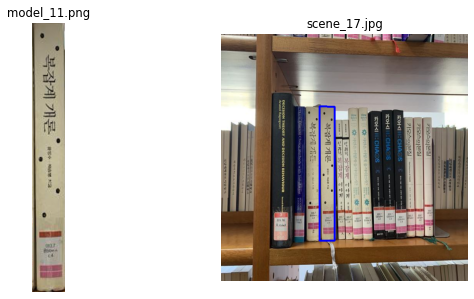

scene_17.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (255.29, 535.68), top_right: (294.66, 535.29), bottom_left: (255.50, 187.76), bottom_right: (294.88, 188.29), area: 13552.50px }



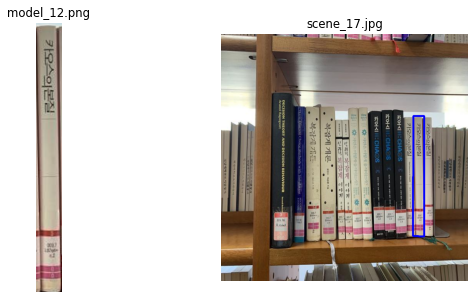

scene_17.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (497.47, 523.89), top_right: (526.82, 524.79), bottom_left: (498.05, 212.45), bottom_right: (526.89, 212.31), area: 8878.00px }



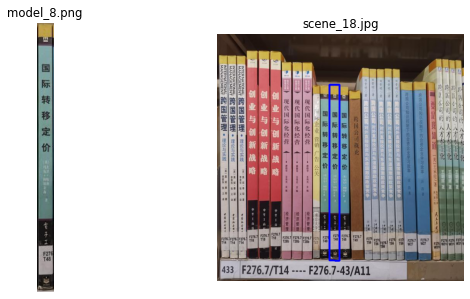

scene_18.jpg:
model_8.png - 1 instance(s) detected:
  Instance 1 {top_left: (291.30, 586.74), top_right: (317.73, 587.05), bottom_left: (291.52, 131.37), bottom_right: (317.98, 131.26), area: 11843.00px }



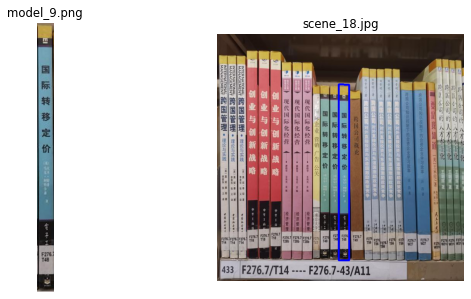

scene_18.jpg:
model_9.png - 1 instance(s) detected:
  Instance 1 {top_left: (315.83, 586.81), top_right: (342.23, 586.12), bottom_left: (315.63, 130.31), bottom_right: (342.03, 131.17), area: 12298.50px }



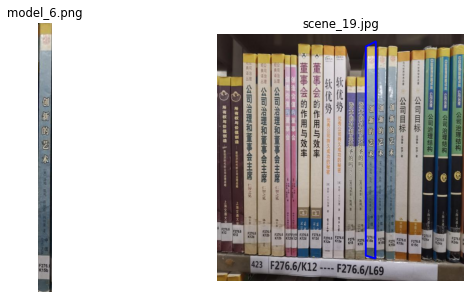

scene_19.jpg:
model_6.png - 1 instance(s) detected:
  Instance 1 {top_left: (385.48, 574.06), top_right: (410.98, 581.18), bottom_left: (385.24, 32.83), bottom_right: (411.37, 19.82), area: 14074.50px }



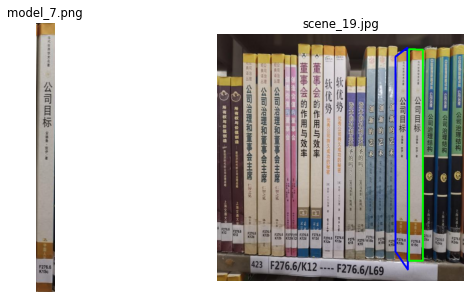

scene_19.jpg:
model_7.png - 2 instance(s) detected:
  Instance 1 {top_left: (462.21, 563.92), top_right: (494.18, 610.33), bottom_left: (462.75, 58.25), bottom_right: (493.86, 35.67), area: 17004.00px }
  Instance 2 {top_left: (497.21, 587.20), top_right: (533.37, 587.86), bottom_left: (497.23, 39.43), bottom_right: (533.44, 40.72), area: 19710.00px }



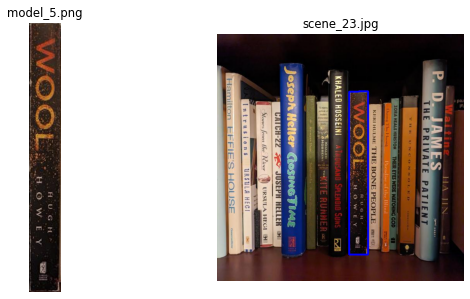

scene_23.jpg:
model_5.png - 1 instance(s) detected:
  Instance 1 {top_left: (342.56, 571.85), top_right: (391.04, 571.82), bottom_left: (342.59, 149.87), bottom_right: (391.06, 148.98), area: 20702.50px }



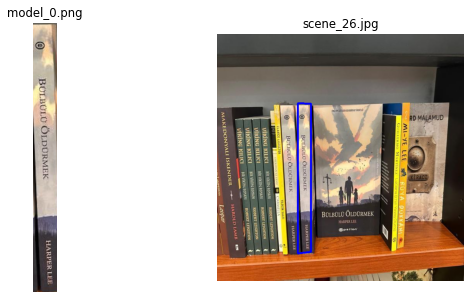

scene_26.jpg:
model_0.png - 1 instance(s) detected:
  Instance 1 {top_left: (209.98, 568.13), top_right: (243.92, 564.33), bottom_left: (209.62, 179.51), bottom_right: (243.92, 180.48), area: 13141.00px }



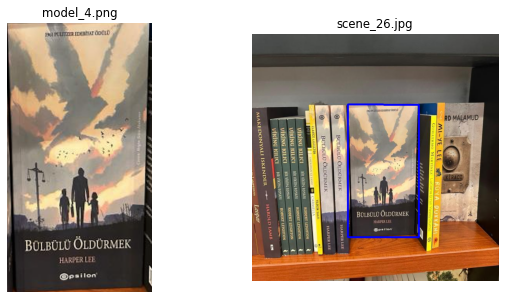

scene_26.jpg:
model_4.png - 1 instance(s) detected:
  Instance 1 {top_left: (248.50, 526.48), top_right: (432.19, 526.18), bottom_left: (248.52, 182.96), bottom_right: (432.17, 183.18), area: 63204.00px }



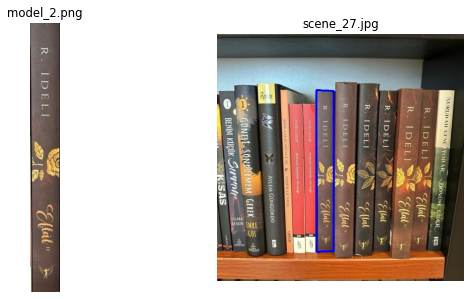

scene_27.jpg:
model_2.png - 1 instance(s) detected:
  Instance 1 {top_left: (257.82, 564.06), top_right: (302.24, 562.93), bottom_left: (257.92, 145.09), bottom_right: (302.36, 147.95), area: 18765.00px }



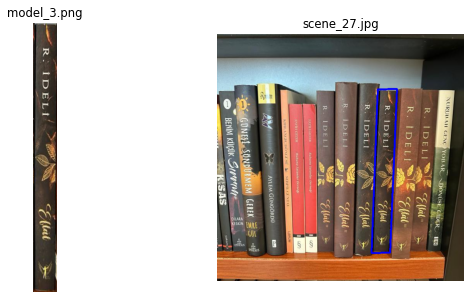

scene_27.jpg:
model_3.png - 1 instance(s) detected:
  Instance 1 {top_left: (400.09, 567.04), top_right: (448.48, 566.60), bottom_left: (416.30, 143.40), bottom_right: (466.17, 142.80), area: 20759.00px }



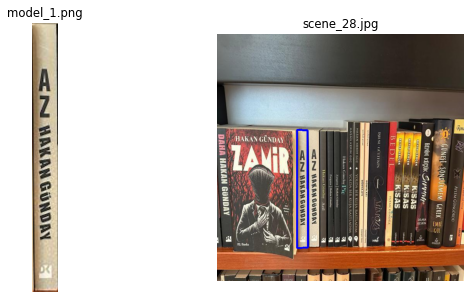

scene_28.jpg:
model_1.png - 1 instance(s) detected:
  Instance 1 {top_left: (207.39, 554.84), top_right: (235.19, 553.87), bottom_left: (207.30, 248.05), bottom_right: (234.94, 249.06), area: 8387.50px }


Total book instances found: 28


In [21]:
# Apply median blur to grayscale images
median_scenes = [cv2.medianBlur(img, 3) for img in scenes_gray]
median_models = [cv2.medianBlur(img, 3) for img in models_gray]

# Compute Laplacian variance for filtered images
lap_median_scenes, lap_vars_median_scenes = laplacian_variance(median_scenes)
lap_median_models, lap_vars_median_models = laplacian_variance(median_models)

# Plot comparison with original variance
plot_laplacian_variance([lap_s_vars, lap_vars_median_scenes], "Scene",
                        "Laplacian Variance after Median Filter on Scenes",
                        1000, ["Original", "Median Filtered"])
plot_laplacian_variance([lap_m_vars, lap_vars_median_models], "Model",
                        "Laplacian Variance after Median Filter on Models",
                        500, ["Original", "Median Filtered"])

print('\n', 60 * '=', '\n')

# Run detection on median-filtered images
run_detection_pipeline(
    median_models,
    median_scenes,
    models,
    scenes,
    model_files,
    scene_files
)


## 18. Applying Gaussian Filter and Evaluating Impact

Since visual inspection confirmed the absence of salt-and-pepper noise, we applied a **Gaussian filter**, which is more suitable for smoothing general image noise.

- We used a Gaussian kernel size of **(3,3)** and standard deviation **σ = 0.4** to reduce noise without overly blurring object edges.
- The Laplacian variance plots show a moderate reduction in variance compared to the original images, indicating smoother results.

After applying the detection pipeline to the filtered images, we observed **37 instances detected**, compared to **39** in the unfiltered case.

This improvement confirms that the **Gaussian filter is better suited** to this dataset and helps enhance detection performance without sacrificing detail.


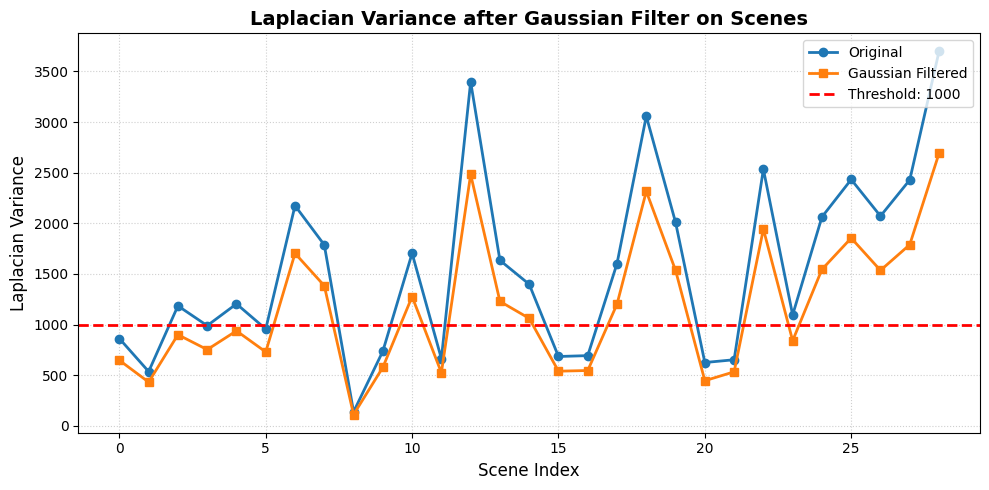

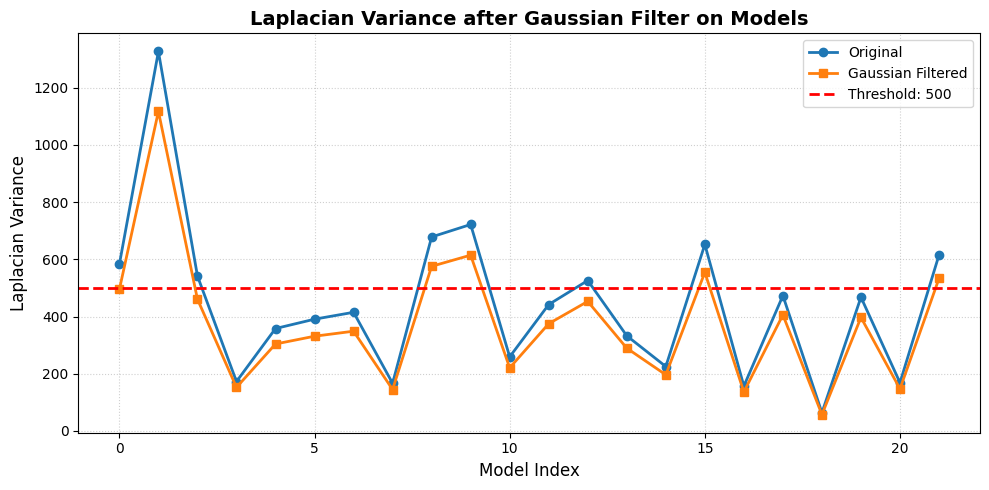

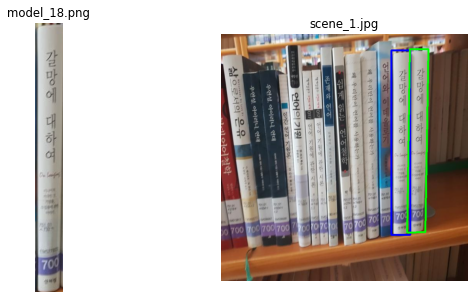

scene_1.jpg:
model_18.png - 2 instance(s) detected:
  Instance 1 {top_left: (441.68, 520.56), top_right: (490.43, 520.59), bottom_left: (441.61, 42.69), bottom_right: (490.30, 42.55), area: 23422.00px }
  Instance 2 {top_left: (482.33, 514.19), top_right: (529.96, 513.66), bottom_left: (489.73, 39.29), bottom_right: (537.04, 39.71), area: 22535.00px }



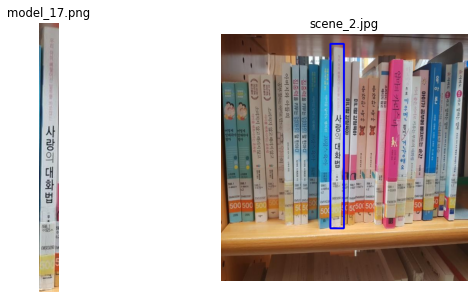

scene_2.jpg:
model_17.png - 1 instance(s) detected:
  Instance 1 {top_left: (283.84, 503.38), top_right: (318.07, 503.36), bottom_left: (283.85, 25.36), bottom_right: (318.09, 25.16), area: 16730.00px }



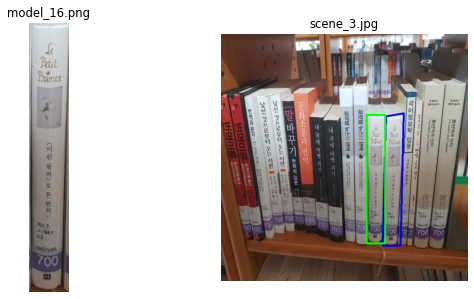

scene_3.jpg:
model_16.png - 2 instance(s) detected:
  Instance 1 {top_left: (419.32, 548.19), top_right: (465.24, 548.96), bottom_left: (427.31, 213.64), bottom_right: (473.51, 205.98), area: 15562.00px }
  Instance 2 {top_left: (377.08, 542.04), top_right: (425.64, 542.30), bottom_left: (377.10, 209.58), bottom_right: (425.70, 209.58), area: 15984.00px }



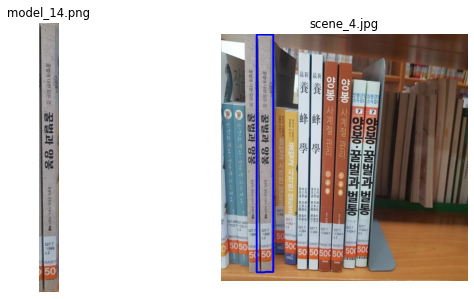

scene_4.jpg:
model_14.png - 1 instance(s) detected:
  Instance 1 {top_left: (92.19, 617.06), top_right: (135.44, 617.00), bottom_left: (92.21, 1.87), bottom_right: (135.47, 1.99), area: 26466.50px }



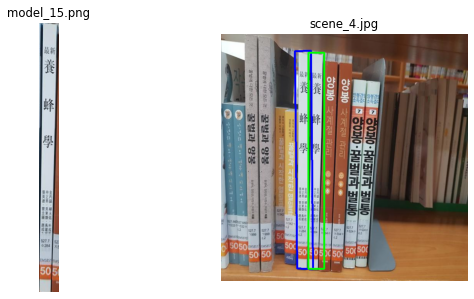

scene_4.jpg:
model_15.png - 2 instance(s) detected:
  Instance 1 {top_left: (197.31, 607.47), top_right: (238.93, 609.68), bottom_left: (191.81, 44.97), bottom_right: (233.86, 43.14), area: 23424.00px }
  Instance 2 {top_left: (226.68, 608.94), top_right: (267.68, 608.83), bottom_left: (226.80, 48.77), bottom_right: (267.74, 48.84), area: 22960.00px }



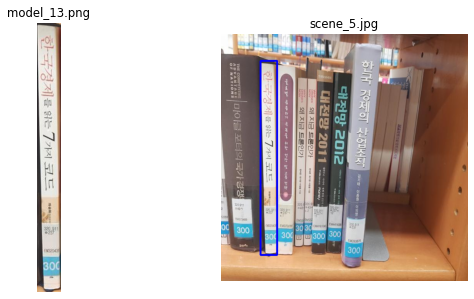

scene_5.jpg:
model_13.png - 1 instance(s) detected:
  Instance 1 {top_left: (102.64, 572.88), top_right: (145.74, 572.94), bottom_left: (102.64, 69.99), bottom_right: (145.74, 69.80), area: 21629.00px }



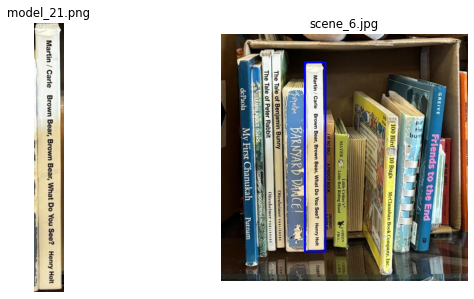

scene_6.jpg:
model_21.png - 1 instance(s) detected:
  Instance 1 {top_left: (217.37, 563.54), top_right: (270.81, 563.59), bottom_left: (217.37, 73.62), bottom_right: (270.81, 73.54), area: 25970.00px }



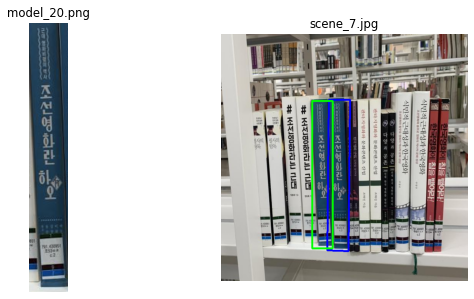

scene_7.jpg:
model_20.png - 2 instance(s) detected:
  Instance 1 {top_left: (275.82, 560.95), top_right: (330.82, 562.90), bottom_left: (279.32, 170.82), bottom_right: (334.78, 170.80), area: 21509.00px }
  Instance 2 {top_left: (236.02, 555.19), top_right: (289.51, 555.27), bottom_left: (236.07, 173.27), bottom_right: (289.58, 173.18), area: 20246.00px }



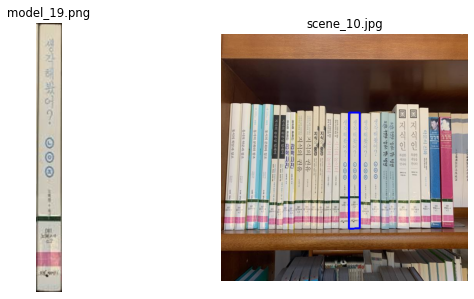

scene_10.jpg:
model_19.png - 1 instance(s) detected:
  Instance 1 {top_left: (332.00, 504.07), top_right: (359.63, 503.97), bottom_left: (331.98, 203.51), bottom_right: (359.53, 203.89), area: 8414.00px }



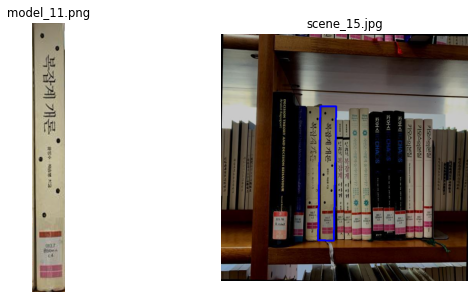

scene_15.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (251.67, 534.63), top_right: (292.47, 535.53), bottom_left: (257.60, 187.32), bottom_right: (298.44, 187.63), area: 14250.50px }



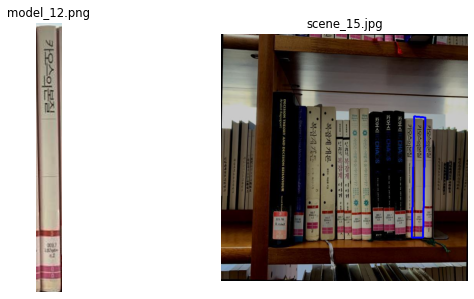

scene_15.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.47, 527.47), top_right: (523.48, 527.47), bottom_left: (500.04, 213.67), bottom_right: (529.04, 216.16), area: 9071.50px }



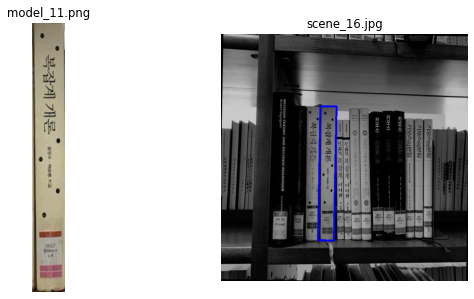

scene_16.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (251.07, 534.67), top_right: (292.68, 535.86), bottom_left: (257.40, 187.32), bottom_right: (299.02, 187.63), area: 14424.50px }



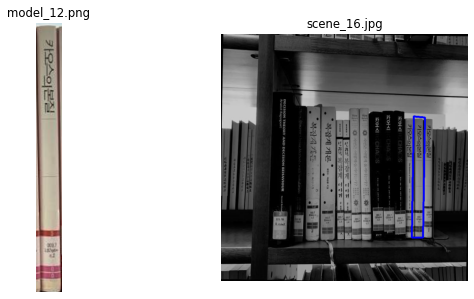

scene_16.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (494.63, 527.43), top_right: (523.76, 527.26), bottom_left: (499.91, 213.66), bottom_right: (528.98, 216.48), area: 9070.00px }



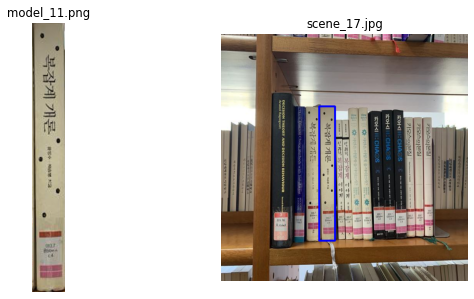

scene_17.jpg:
model_11.png - 1 instance(s) detected:
  Instance 1 {top_left: (254.89, 535.46), top_right: (295.62, 535.68), bottom_left: (254.76, 187.76), bottom_right: (295.48, 187.73), area: 14268.00px }



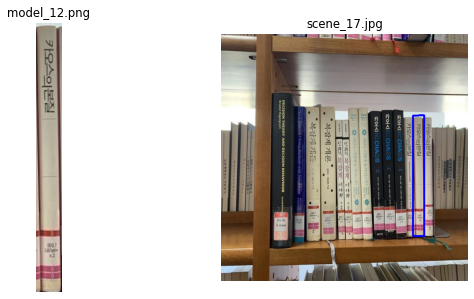

scene_17.jpg:
model_12.png - 1 instance(s) detected:
  Instance 1 {top_left: (497.57, 523.59), top_right: (526.94, 523.61), bottom_left: (497.42, 211.34), bottom_right: (526.81, 210.92), area: 9062.50px }



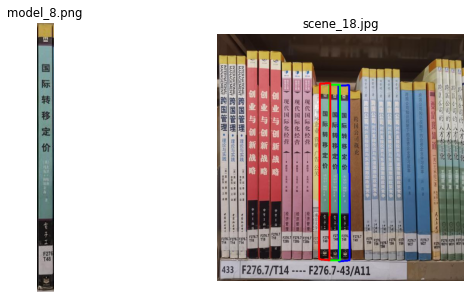

scene_18.jpg:
model_8.png - 3 instance(s) detected:
  Instance 1 {top_left: (315.13, 589.31), top_right: (343.31, 586.67), bottom_left: (314.21, 134.46), bottom_right: (342.29, 132.52), area: 12728.50px }
  Instance 2 {top_left: (291.06, 586.94), top_right: (318.07, 586.95), bottom_left: (291.08, 131.15), bottom_right: (318.08, 131.26), area: 12285.00px }
  Instance 3 {top_left: (264.23, 583.57), top_right: (291.22, 586.42), bottom_left: (266.39, 128.51), bottom_right: (293.53, 127.37), area: 12341.00px }



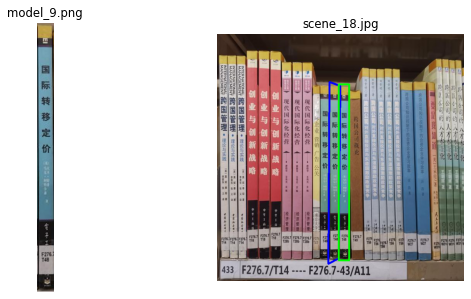

scene_18.jpg:
model_9.png - 2 instance(s) detected:
  Instance 1 {top_left: (288.16, 595.05), top_right: (315.93, 581.80), bottom_left: (291.88, 124.42), bottom_right: (319.17, 134.06), area: 12615.50px }
  Instance 2 {top_left: (315.50, 586.47), top_right: (342.42, 586.35), bottom_left: (315.48, 130.71), bottom_right: (342.39, 130.66), area: 12312.00px }



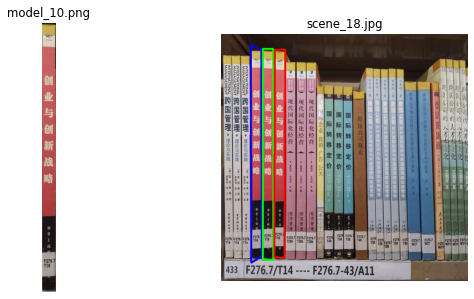

scene_18.jpg:
model_10.png - 3 instance(s) detected:
  Instance 1 {top_left: (78.75, 592.75), top_right: (105.63, 576.36), bottom_left: (77.65, 29.08), bottom_right: (104.62, 41.75), area: 14825.00px }
  Instance 2 {top_left: (108.84, 584.83), top_right: (135.89, 585.01), bottom_left: (108.84, 38.95), bottom_right: (135.88, 38.81), area: 14755.50px }
  Instance 3 {top_left: (138.02, 578.73), top_right: (164.38, 579.80), bottom_left: (139.37, 41.55), bottom_right: (166.54, 40.23), area: 14257.00px }



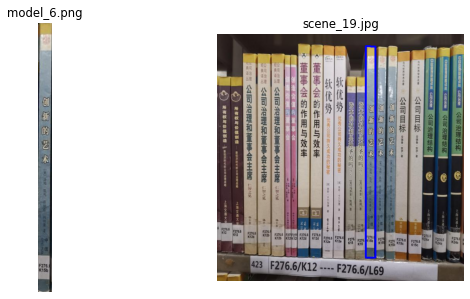

scene_19.jpg:
model_6.png - 1 instance(s) detected:
  Instance 1 {top_left: (385.01, 579.24), top_right: (410.96, 579.14), bottom_left: (385.06, 31.76), bottom_right: (410.98, 32.54), area: 13687.50px }



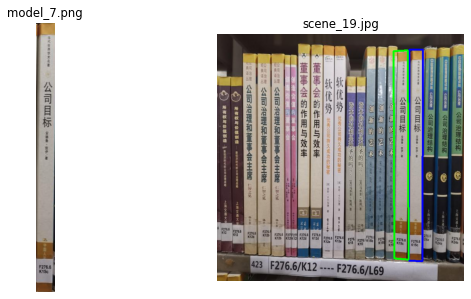

scene_19.jpg:
model_7.png - 2 instance(s) detected:
  Instance 1 {top_left: (497.52, 587.03), top_right: (532.30, 588.10), bottom_left: (498.37, 40.61), bottom_right: (533.13, 40.24), area: 19163.00px }
  Instance 2 {top_left: (459.53, 581.39), top_right: (496.27, 584.02), bottom_left: (457.72, 44.23), bottom_right: (494.64, 42.23), area: 19960.50px }



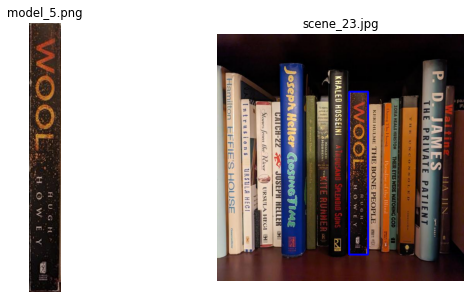

scene_23.jpg:
model_5.png - 1 instance(s) detected:
  Instance 1 {top_left: (342.44, 571.94), top_right: (391.29, 571.84), bottom_left: (342.43, 149.26), bottom_right: (391.30, 149.46), area: 20678.00px }



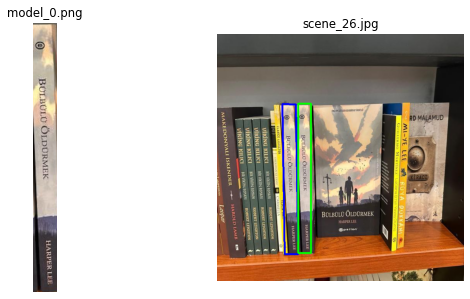

scene_26.jpg:
model_0.png - 2 instance(s) detected:
  Instance 1 {top_left: (175.28, 570.49), top_right: (210.11, 570.13), bottom_left: (169.35, 181.26), bottom_right: (204.49, 182.01), area: 13594.50px }
  Instance 2 {top_left: (210.07, 567.88), top_right: (243.79, 567.75), bottom_left: (210.14, 180.44), bottom_right: (243.85, 180.55), area: 12771.00px }



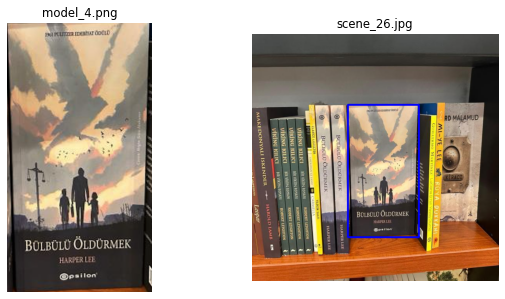

scene_26.jpg:
model_4.png - 1 instance(s) detected:
  Instance 1 {top_left: (248.55, 526.23), top_right: (432.26, 526.20), bottom_left: (248.53, 183.11), bottom_right: (432.25, 183.13), area: 63112.00px }



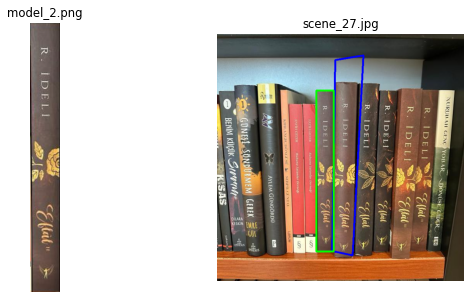

scene_27.jpg:
model_2.png - 2 instance(s) detected:
  Instance 1 {top_left: (298.16, 562.35), top_right: (351.53, 573.69), bottom_left: (306.07, 67.69), bottom_right: (379.29, 55.01), area: 31900.50px }
  Instance 2 {top_left: (257.82, 563.76), top_right: (302.51, 563.46), bottom_left: (257.79, 146.23), bottom_right: (302.45, 146.62), area: 18765.00px }



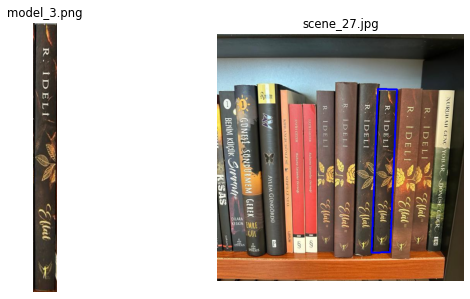

scene_27.jpg:
model_3.png - 1 instance(s) detected:
  Instance 1 {top_left: (400.17, 566.82), top_right: (448.51, 565.85), bottom_left: (416.25, 142.38), bottom_right: (466.23, 143.18), area: 20727.00px }



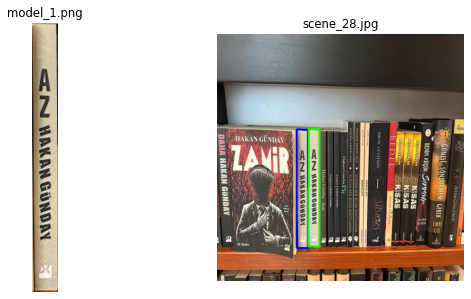

scene_28.jpg:
model_1.png - 2 instance(s) detected:
  Instance 1 {top_left: (206.94, 554.41), top_right: (235.64, 554.09), bottom_left: (206.86, 247.78), bottom_right: (235.56, 248.27), area: 8888.50px }
  Instance 2 {top_left: (236.63, 550.85), top_right: (265.07, 551.62), bottom_left: (237.56, 246.39), bottom_right: (265.72, 245.87), area: 8692.50px }


Total book instances found: 39


In [22]:
# Apply Gaussian filter to grayscale images
gaus_only_scenes = [cv2.GaussianBlur(img, (3, 3), 0.4) for img in scenes_gray]
gaus_only_models = [cv2.GaussianBlur(img, (3, 3), 0.4) for img in models_gray]

# Compute Laplacian variance after filtering
lap_gaus_only_scenes, lap_vars_gaus_only_scenes = laplacian_variance(gaus_only_scenes)
lap_gaus_only_models, lap_vars_gaus_only_models = laplacian_variance(gaus_only_models)

# Plot comparison with original images
plot_laplacian_variance(
    [lap_s_vars, lap_vars_gaus_only_scenes],
    "Scene",
    "Laplacian Variance after Gaussian Filter on Scenes",
    1000,
    ["Original", "Gaussian Filtered"]
)

plot_laplacian_variance(
    [lap_m_vars, lap_vars_gaus_only_models],
    "Model",
    "Laplacian Variance after Gaussian Filter on Models",
    500,
    ["Original", "Gaussian Filtered"]
)

print('\n', 60 * '=', '\n')

# Run detection on Gaussian-filtered images
run_detection_pipeline(
    gaus_only_models,
    gaus_only_scenes,
    models,
    scenes,
    model_files,
    scene_files
)
